# Plot image stat data

In [2]:
from pathlib import Path
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from multiprocessing import Pool
from tqdm import tqdm

wkdir = Path(r"D:\rectify")
rawdir = Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\crop1891\1st")

## Heatmap

In [2]:
import pickle

with open(wkdir / 'fig' / 'raw_hist.pickle', 'rb') as f:
    hist1, path1 = pickle.load(f)

with open(wkdir / 'fig' / 'enh_hist.pickle', 'rb') as f:
    hist2, path2 = pickle.load(f)

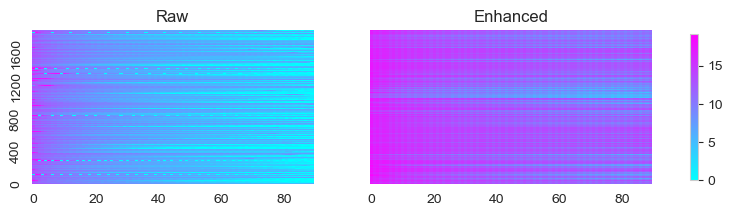

In [11]:
def heatmap(title, data, **kwargs):
    heatmap = sns.heatmap(data, cmap='cool', linewidths=0, xticklabels=20,
                          yticklabels=400, **kwargs)
    heatmap.invert_yaxis()
    if 'ax' in kwargs:
        kwargs['ax'].set_title(title)
    else:
        plt.title(title)

import matplotlib.colors as mcolors
h1 = np.log(hist1[:, 5:95] + 1)
h2 = np.log(hist2[:, 5:95] + 1)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 2), sharey=True)
im = heatmap('Raw', h1, ax=axes[0], cbar=False)
heatmap('Enhanced', h2, ax=axes[1], cbar=False)

norm = mcolors.Normalize(vmin=min(h1.min(), h2.min()), vmax=max(h1.max(), h2.max()))

fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap='cool'), ax=axes.ravel().tolist(), shrink=.95)
plt.show()

## mip

<Figure size 640x480 with 0 Axes>

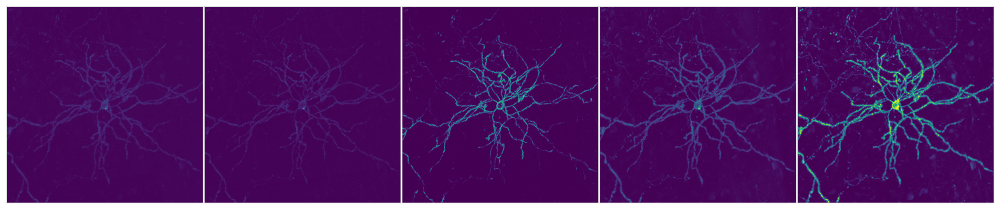

In [243]:
from v3dpy.loaders import PBD, Raw
wkdir = r'D:\rectify'
import matplotlib.pyplot as plt
from pathlib import Path

def mip_row(name):
    p = PBD()
    plt.viridis()
    plt.figure(figsize=(20,4))

    # raw
    img = p.load(Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\crop1891\1st") / name)[0].max(axis=0)
    plt.subplot(151)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    # ada thr
    img = p.load(Path(r'Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\adathr') / name)[0].max(axis=0)
    plt.subplot(152)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    # multiscale
    img = Raw().load((Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\multiscale") / name).with_suffix('.v3draw'))[0].max(axis=0)
    plt.subplot(153)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    # guo
    img = p.load((Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\guo_enh_8") / name))[0].max(axis=0)
    plt.subplot(154)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])

    # my method
    img = p.load(Path(r"D:\rectify\my") / name)[0].max(axis=0)
    plt.subplot(155)
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.subplots_adjust(wspace=0)

mip_row('18464_24239_17260_4244.v3dpbd')

<Figure size 640x480 with 0 Axes>

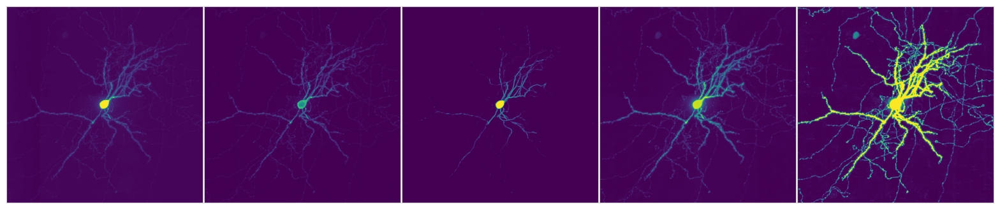

In [244]:
mip_row('17302_15085_35257_2300.v3dpbd')

<Figure size 640x480 with 0 Axes>

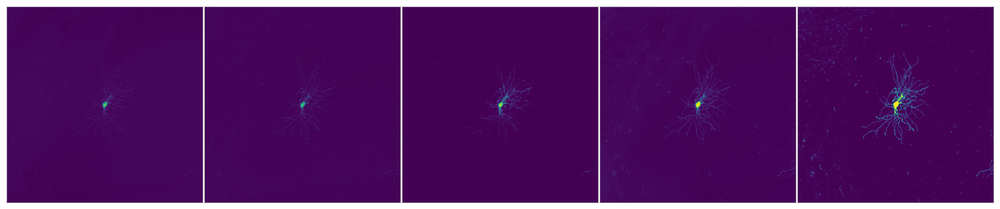

In [245]:
mip_row('18462_9516_8250_6629.v3dpbd')

<Figure size 640x480 with 0 Axes>

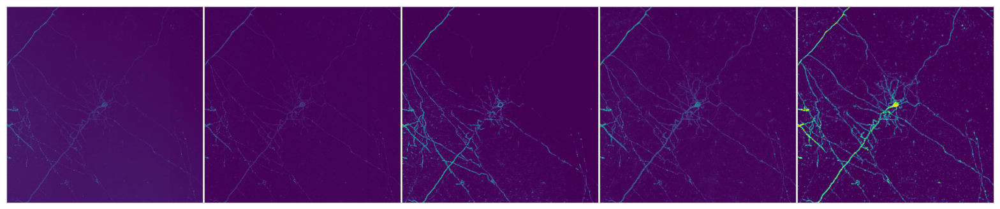

In [246]:
mip_row('191807_5617_23071_5031.v3dpbd')

<Figure size 640x480 with 0 Axes>

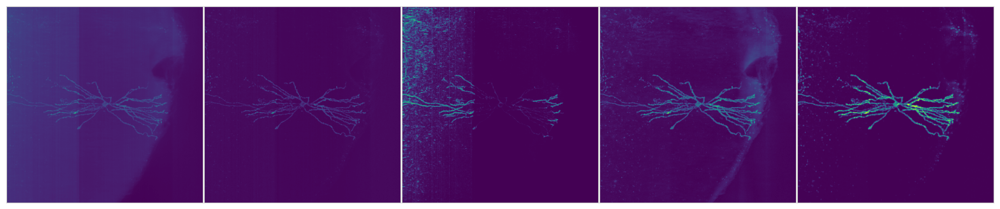

In [247]:
mip_row('191801_15030_11091_4231.v3dpbd')

<Figure size 640x480 with 0 Axes>

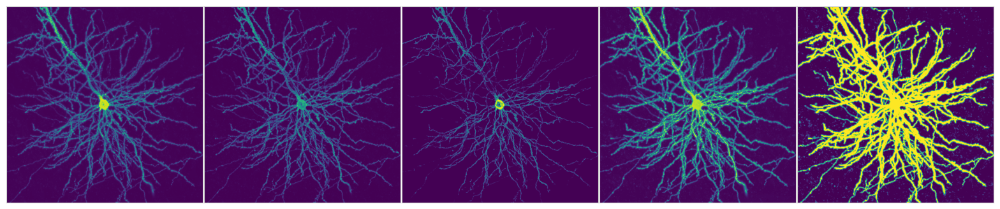

In [248]:
mip_row(r'18867_13638_8774_2878.v3dpbd')

<Figure size 640x480 with 0 Axes>

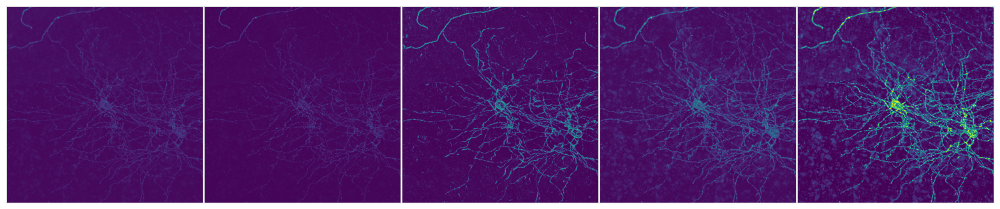

In [249]:
mip_row('18464_21900_10258_5509.v3dpbd')

# benchmark

In [304]:
df = pd.read_csv(r"D:\rectify\optj_f1.csv", index_col=0)
df.mean()

my     0.788988
ada    0.739132
mul    0.624280
guo    0.804306
raw    0.759447
dtype: float64

In [13]:
import pandas as pd
import numpy as np
from matplotlib import ticker
import seaborn as sns
df = pd.read_csv(r"D:\rectify\eval.csv", index_col=0)
df['raw_f1'] = 2 * (df['raw_precision'] * df['raw_recall']) / (df['raw_precision'] + df['raw_recall'] + .00001)
df['guo_f1'] = 2 * (df['guo_precision'] * df['guo_recall']) / (df['guo_precision'] + df['guo_recall'] + .00001)
df['mul_f1'] = 2 * (df['mul_precision'] * df['mul_recall']) / (df['mul_precision'] + df['mul_recall'] + .00001)
df['ada_f1'] = 2 * (df['ada_precision'] * df['ada_recall']) / (df['ada_precision'] + df['ada_recall'] + .00001)
df['my_f1'] = 2 * (df['my_precision'] * df['my_recall']) / (df['my_precision'] + df['my_recall'] + .00001)

def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

from scipy.stats import  ttest_ind
df.mean()

raw_recall       0.795265
my_recall        0.908440
guo_recall       0.890760
ada_recall       0.660809
mul_recall       0.430004
raw_precision    0.862581
my_precision     0.883282
guo_precision    0.846659
ada_precision    0.931760
mul_precision    0.957706
raw_f1           0.781998
guo_f1           0.842523
mul_f1           0.551321
ada_f1           0.741536
my_f1            0.879231
dtype: float64

In [14]:
(df['my_precision'].mean() - df['guo_precision'].mean()) / df['guo_precision'].mean()

0.04325582272237596

In [15]:
((df['my_f1'] > df['guo_f1']) & (df['my_f1'] > df['raw_f1']) & (df['my_f1'] > df['ada_f1']) & (df['my_f1'] > df['mul_f1'])).sum() / 863 


0.5237543453070683

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Raw'),
  Text(1, 0, 'AdaThr'),
  Text(2, 0, 'Multiscale'),
  Text(3, 0, 'Guo'),
  Text(4, 0, 'NIEND')])

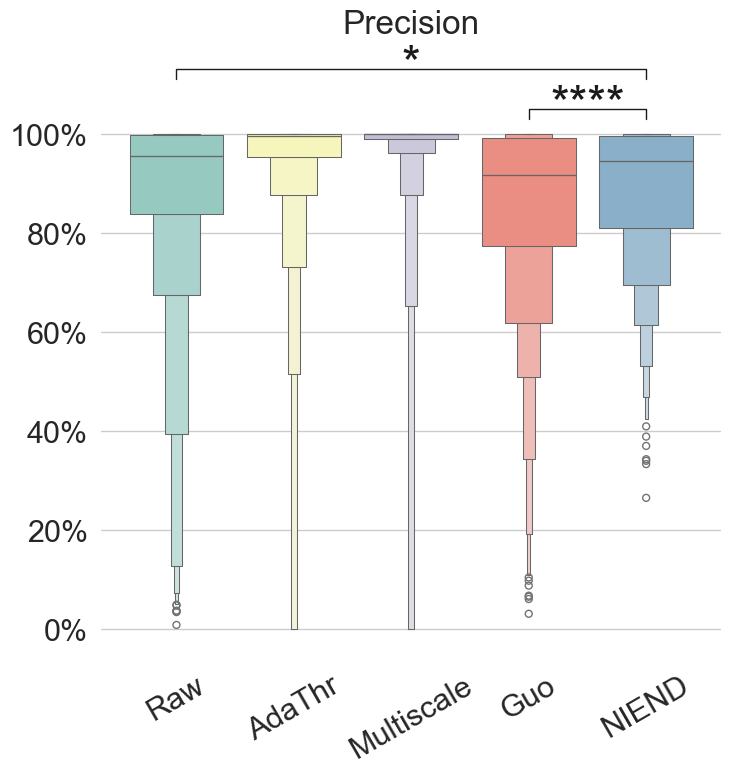

In [16]:
# plot precision
sns.set(font_scale=2, style='whitegrid')
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
ax = sns.boxenplot(data=df[['raw_precision', 'ada_precision', 'mul_precision', 'guo_precision', 'my_precision']], palette="Set3",
                   )
plt.xticks([*range(5)], ['Raw', 'AdaThr', 'Multiscale', 'Guo', 'NIEND'])
plt.yticks([0., .2, .4, .6, .8, 1.])
plt.title(f'Precision')
plt.gca().yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=0))
sns.despine(left=True, bottom=True)

x1, x2 = 0, 4
y, h = 1.15 - .04, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['raw_precision'], df['my_precision'])
ax.text((x1+x2)*.5, y - h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
#
# x1, x2 = 1, 4
# y, h = 1.15 - .04, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['ada_precision'], df['my_precision'])
# ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
#
# x1, x2 = 2, 4
# y, h = 1.15 - .08, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['mul_precision'], df['my_precision'])
# ax.text((x1+x2)*.5, y+h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='large')

x1, x2 = 3, 4
y, h = 1.15 - .12, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['guo_precision'], df['my_precision'])
ax.text((x1+x2)*.5, y - h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
plt.xticks(rotation=30)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Raw'),
  Text(1, 0, 'AdaThr'),
  Text(2, 0, 'Multiscale'),
  Text(3, 0, 'Guo'),
  Text(4, 0, 'NIEND')])

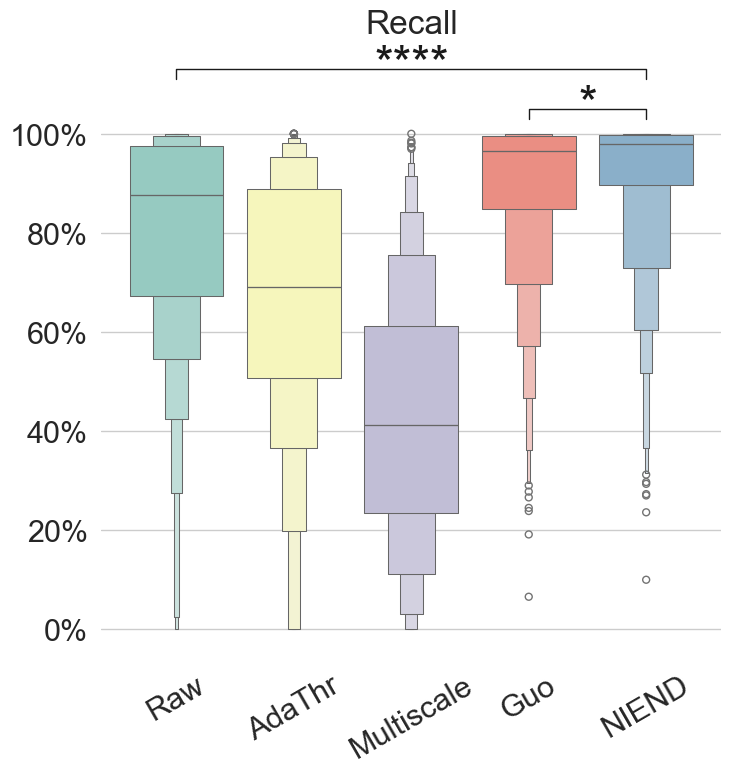

In [17]:
# plot recall
sns.set(font_scale=2, style='whitegrid')
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
ax = sns.boxenplot(data=df[['raw_recall', 'ada_recall', 'mul_recall', 'guo_recall', 'my_recall']], palette="Set3")
plt.yticks([0., .2, .4, .6, .8, 1.])
plt.xticks([*range(5)], ['Raw', 'AdaThr', 'Multiscale', 'Guo', 'NIEND'])
plt.title(f'Recall')
plt.gca().yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1, decimals=0))
sns.despine(left=True, bottom=True)

x1, x2 = 0, 4
y, h = 1.15 -.04, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['raw_recall'], df['my_recall'])
ax.text((x1+x2)*.5, y-h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

# x1, x2 = 1, 4
# y, h = 1.15 - .04, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['ada_recall'], df['my_recall'])
# ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
#
# x1, x2 = 2, 4
# y, h = 1.15 - .08, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['mul_recall'], df['my_recall'])
# ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

x1, x2 = 3, 4
y, h = 1.15 - .12, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['guo_recall'], df['my_recall'])
ax.text((x1+x2)*.5, y-h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
plt.xticks(rotation=30)

(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'Raw'),
  Text(1, 0, 'AdaThr'),
  Text(2, 0, 'Multiscale'),
  Text(3, 0, 'Guo'),
  Text(4, 0, 'NIEND')])

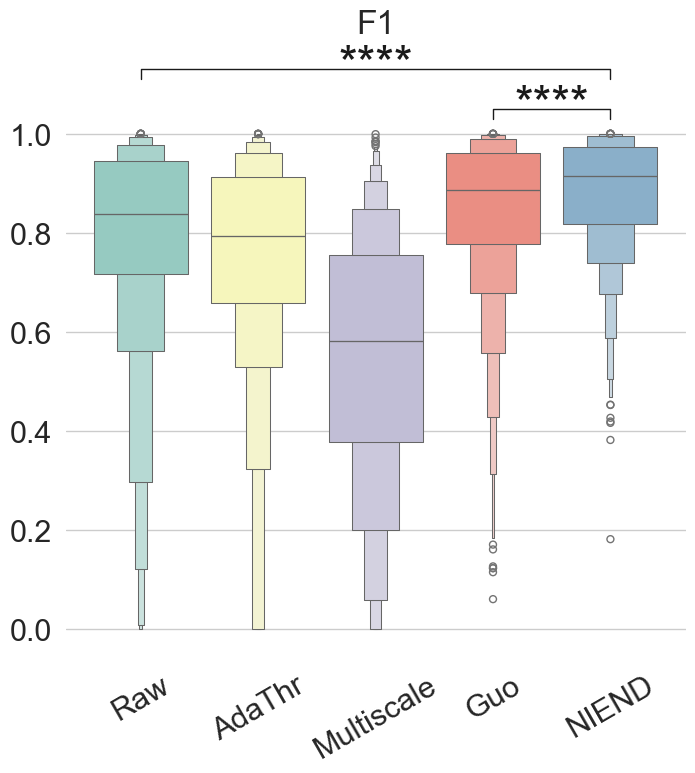

In [18]:
# plot f1
sns.set(font_scale=2, style='whitegrid')
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 8))
ax = sns.boxenplot(data=df[['raw_f1', 'ada_f1', 'mul_f1', 'guo_f1', 'my_f1']], palette="Set3")
plt.yticks([0., .2, .4, .6, .8, 1.])
plt.xticks([*range(5)], ['Raw', 'AdaThr', 'Multiscale', 'Guo', 'NIEND'])
plt.title(f'F1')
sns.despine(left=True, bottom=True)

x1, x2 = 0, 4
y, h = 1.15 -.04, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['raw_f1'], df['my_f1'])
ax.text((x1+x2)*.5, y-h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

# x1, x2 = 1, 4
# y, h = 1.15 - .04, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['ada_f1'], df['my_f1'])
# ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
#
# x1, x2 = 2, 4
# y, h = 1.15 - .08, .01
# ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
# stat,p_value = ttest_ind(df['mul_f1'], df['my_f1'])
# ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

x1, x2 = 3, 4
y, h = 1.15 - .12, .02
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(df['guo_f1'], df['my_f1'])
ax.text((x1+x2)*.5, y-h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
plt.xticks(rotation=30)

# mip swc

<Figure size 640x480 with 0 Axes>

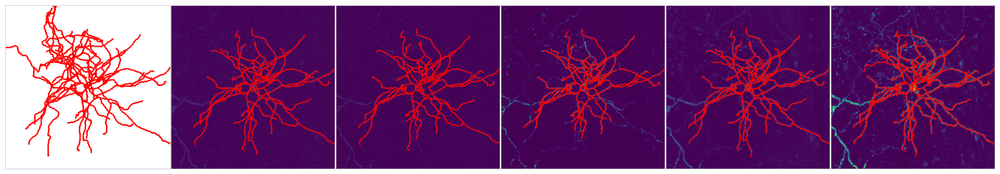

In [289]:
from v3dpy.loaders import PBD, Raw
wkdir = r'D:\rectify'
import matplotlib.pyplot as plt
from pathlib import Path
import swc_handler

def mip_row(name):
    p = PBD()
    plt.viridis()
    plt.figure(figsize=(24,4))

    # manual
    plt.subplot(161)
    swc = r'D:\rectify\manual' / Path(name).with_suffix('.swc')
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])
    plt.ylim(0, 1024)
    plt.xlim(0, 1024)
    plt.gca().invert_yaxis()

    # raw
    path = Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\crop1891\1st") / name
    swc = r'D:\rectify\raw_app2' / Path(name).with_suffix('.swc')
    img = p.load(path)[0].max(axis=0)
    plt.subplot(162)
    plt.imshow(img)
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])

    # ada thr
    img = p.load(Path(r'Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\adathr') / name)[0].max(axis=0)
    plt.subplot(163)
    plt.imshow(img)
    swc = r'Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\adathr_app2' / Path(name).with_suffix('.swc')
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])

    # multiscale
    img = Raw().load((Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\multiscale") / name).with_suffix('.v3draw'))[0].max(axis=0)
    plt.subplot(164)
    plt.imshow(img)
    swc = r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\multiscale_app2" / Path(name).with_suffix('.swc')
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])

    # guo
    img = p.load((Path(r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\guo_enh_8") / name))[0].max(axis=0)
    plt.subplot(165)
    plt.imshow(img)
    swc = r"Z:\SEU-ALLEN\Users\zuohan\trans\rectify_1891\guo8_app2" / Path(name).with_suffix('.swc')
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])

    # my method
    img = p.load(Path(r"D:\rectify\my") / name)[0].max(axis=0)
    plt.subplot(166)
    plt.imshow(img)
    swc= r'D:\rectify\my_app2' / Path(name).with_suffix('.swc')
    tree = swc_handler.parse_swc(swc) if swc.exists() else []
    if len(tree) > 0:
        tree = np.transpose([i[2:4] for i in tree])
        plt.scatter(tree[0], tree[1], s=1, c=['#ff0000'])
    plt.xticks([])
    plt.yticks([])
    plt.subplots_adjust(wspace=0)

mip_row('18464_24239_17260_4244.v3dpbd')

<Figure size 640x480 with 0 Axes>

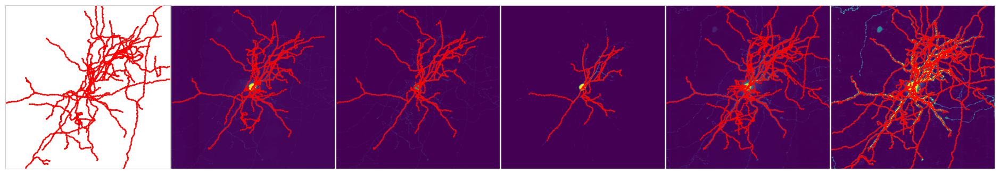

In [290]:
mip_row('17302_15085_35257_2300.v3dpbd')

<Figure size 640x480 with 0 Axes>

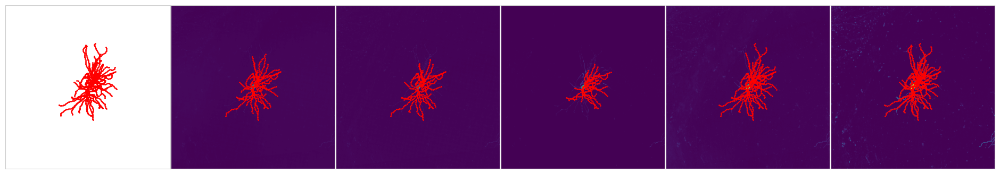

In [292]:
mip_row('18462_9516_8250_6629.v3dpbd')

<Figure size 640x480 with 0 Axes>

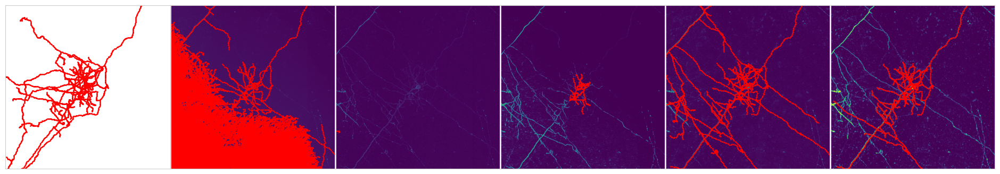

In [291]:
mip_row('191807_5617_23071_5031.v3dpbd')

<Figure size 640x480 with 0 Axes>

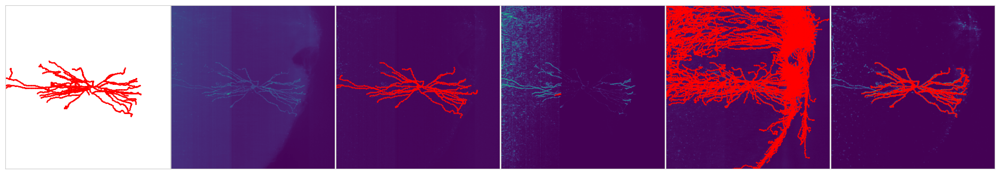

In [293]:
mip_row('191801_15030_11091_4231.v3dpbd')

<Figure size 640x480 with 0 Axes>

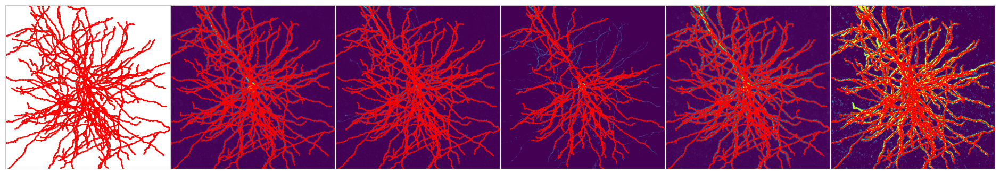

In [294]:
mip_row(r'18867_13638_8774_2878.v3dpbd')

<Figure size 640x480 with 0 Axes>

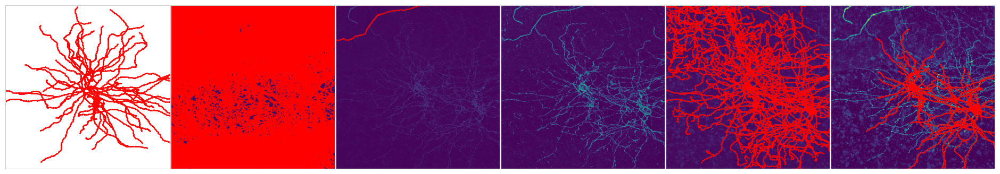

In [295]:
mip_row('18464_21900_10258_5509.v3dpbd')

# ablation

In [156]:
import pandas as pd
import numpy as np
from matplotlib import ticker
import seaborn as sns
df = pd.read_csv(r"D:\rectify\ablation\eval.csv", index_col=0)
df['bit8_f1'] = 2 * (df['bit8_precision'] * df['bit8_recall']) / (df['bit8_precision'] + df['bit8_recall'] + .00001)
df['ff_f1'] = 2 * (df['ff_precision'] * df['ff_recall']) / (df['ff_precision'] + df['ff_recall'] + .00001)
df['vert_f1'] = 2 * (df['vert_precision'] * df['vert_recall']) / (df['vert_precision'] + df['vert_recall'] + .00001)
df['wvlet_f1'] = 2 * (df['wvlet_precision'] * df['wvlet_recall']) / (df['wvlet_precision'] + df['wvlet_recall'] + .00001)
df['my_f1'] = 2 * (df['my_precision'] * df['my_recall']) / (df['my_precision'] + df['my_recall'] + .00001)
df['clip_f1'] = 2 * (df['clip_precision'] * df['clip_recall']) / (df['clip_precision'] + df['clip_recall'] + .00001)

def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"

from scipy.stats import  ttest_ind

In [170]:
e = df.loc[df['my_f1'] < df['vert_f1']]
e['diff'] = e['my_f1'] - e['vert_f1']
e.sort_values(by='diff')[['my_recall', 'vert_recall', 'my_f1', 'vert_f1', 'my_precision', 'vert_precision']]

C:\Users\zzh\AppData\Local\Temp\ipykernel_55640\3600951495.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  e['diff'] = e['my_f1'] - e['vert_f1']


,my_recall,vert_recall,my_f1,vert_f1,my_precision,vert_precision
18464_11650_10083_5623.swc,0.462895,0.621421,0.631126,0.764244,0.991470,0.992326
18454_11881_8369_3518.swc,1.000000,0.998523,0.777986,0.910771,0.636649,0.837205
18867_23698_15758_4791.swc,0.458657,0.563369,0.623408,0.714263,0.972885,0.975578
182712_20141_26708_3895.swc,0.995431,0.995431,0.895414,0.963268,0.813669,0.933128
18464_9476_10896_3775.swc,0.690959,0.779936,0.815052,0.874179,0.993490,0.994340
...,...,...,...,...,...,...
18465_13698_10751_3342.swc,0.949861,0.949861,0.973851,0.973854,0.999095,0.999101
191807_7498_24190_4925.swc,0.996377,0.996732,0.945719,0.945721,0.899973,0.899687
18464_24558_11951_6256.swc,0.999794,0.999794,0.999692,0.999693,0.999600,0.999602
18457_13911_13141_4131.swc,0.979837,0.979837,0.989673,0.989673,0.999718,0.999719


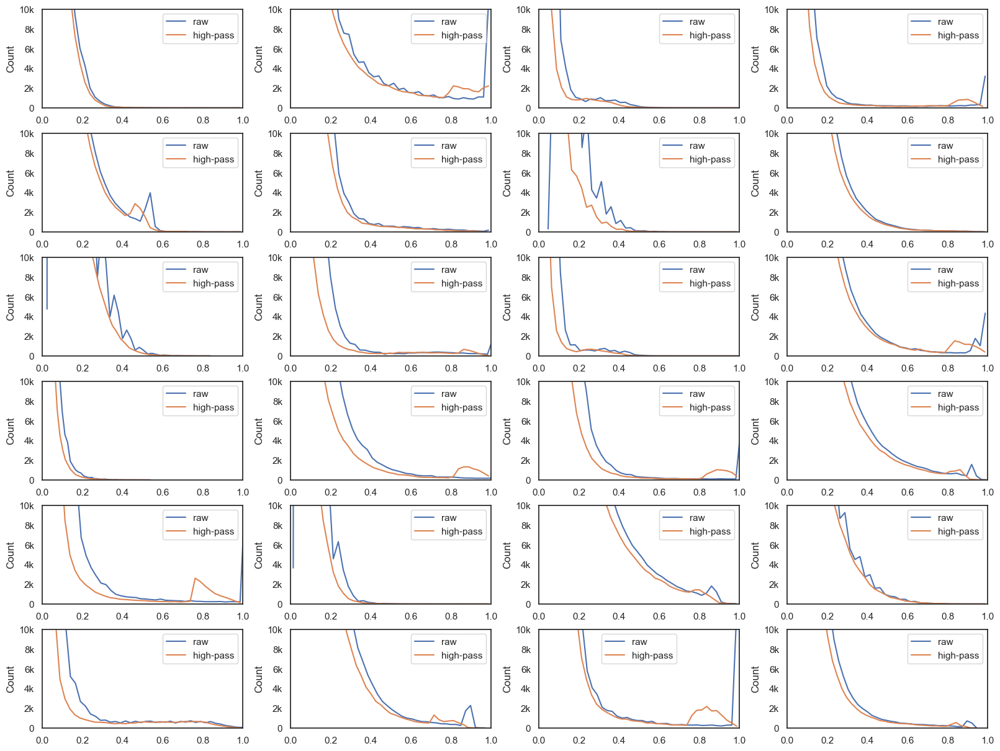

In [196]:
import pickle
from pathlib import Path
wkdir = Path(r"D:\rectify")
with open(wkdir / 'masking.pickle', 'rb') as f:
    masking = pickle.load(f)
nrow, ncol = 6,4
from random import sample
sample_mask = sample(masking, nrow*ncol)
import seaborn as sns

sns.set_theme(style="white", palette=None)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(nrow, ncol, layout='constrained', figsize=(ncol*4, nrow*2))
for ax, (id, raw, high) in zip(axs.flat, sample_mask):
    sns.histplot(raw, ax=ax, bins=40, fill=False, element='poly')
    sns.histplot(high, ax=ax, bins=40, fill=False, element='poly')
    ax.legend([f'raw', f'high-pass'])
    ax.set_ylim(0, 10000)
    ax.set_yticks([i * 2000 for i in range(6)], ['0'] + [f'{i*2}k' for i in range(1, 6)])
    ax.set_xlim(0, 1)
plt.show()


In [201]:
import pickle
from pathlib import Path
import numpy as np
wkdir = Path(r"D:\rectify")
with open(wkdir / 'thr_sampling.pickle', 'rb') as f:
    thr_masked = pickle.load(f)

from random import sample
nrow, ncol = 6, 4
sample_thr = sample(thr_masked, nrow*ncol)


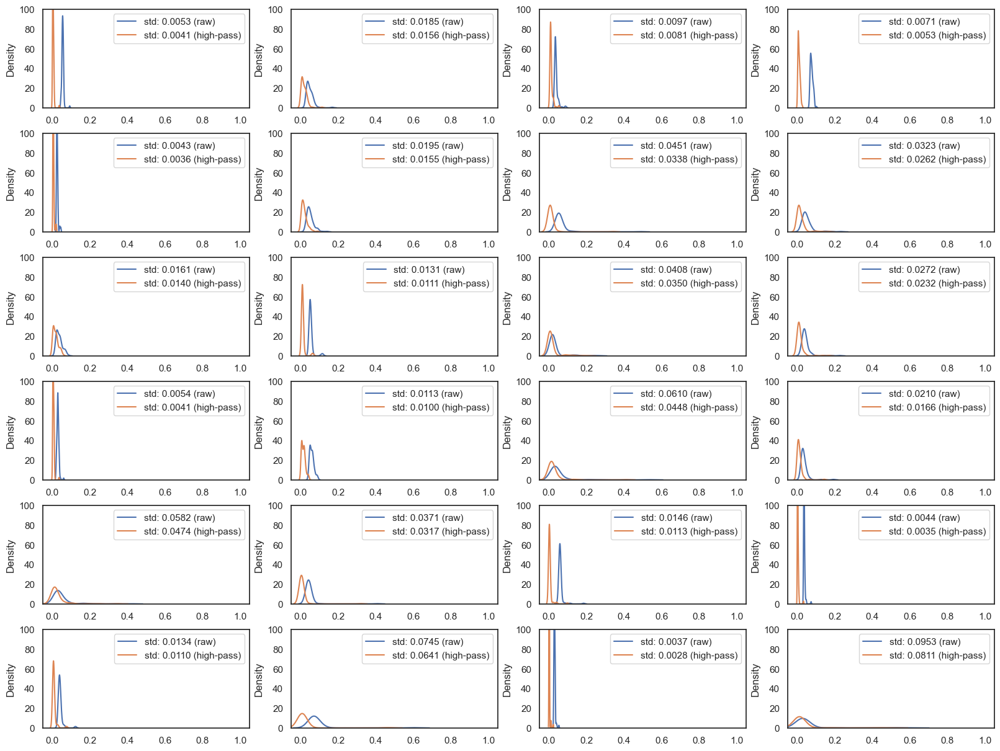

-0.18014043857154322


In [204]:
import seaborn as sns
sns.set_theme(style="white", palette=None)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(nrow, ncol, layout='constrained', figsize=(ncol*4, nrow*2))
std_raw = []
std_high = []
for ax, (raw, high) in zip(axs.flat, sample_thr):
    sns.kdeplot(raw, ax=ax, fill=False)
    sns.kdeplot(high, ax=ax, fill=False)
    std_raw.append(np.std(raw))
    std_high.append(np.std(high))
    ax.legend([f'std: {std_raw[-1]:.4f} (raw)', f'std: {std_high[-1]:.4f} (high-pass)'])
    ax.set_ylabel('Density')
    # ax.set_xticks([0, 1])
    # ax.set_yticks([0, 100])
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(0, 100)
plt.show()
print((np.mean(std_high) - np.mean(std_raw)) / np.mean(std_raw))

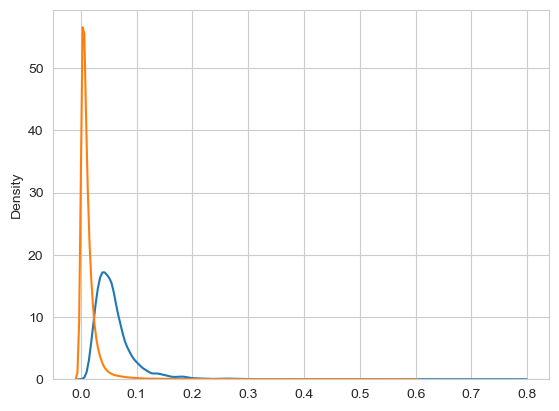

In [24]:
import pickle
from pathlib import Path
wkdir = Path(r"D:\rectify")
with open(wkdir / 'masking.pickle', 'rb') as f:
    masking = pickle.load(f)
with open(wkdir / 'thr_sampling.pickle', 'rb') as f:
    thrs = pickle.load(f)

import seaborn as sns

import matplotlib.pyplot as plt
r = []
h = []
for i, j in zip(thrs, masking):
    r.extend(i[0] / j[1].max())
    h.extend(i[1] / j[1].max())
ax = plt.subplot()
sns.kdeplot(r, ax=ax, fill=False)
sns.kdeplot(h, ax=ax, fill=False)
plt.show()

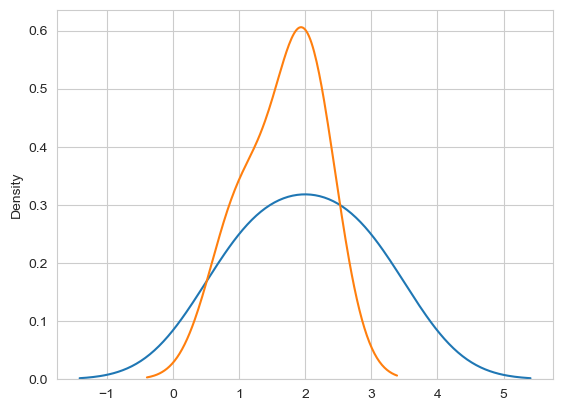

In [9]:
axx = plt.subplot()
sns.histplot([1,2,3],ax=axx)
sns.kdeplot([1,2,2],ax=axx)
plt.show()

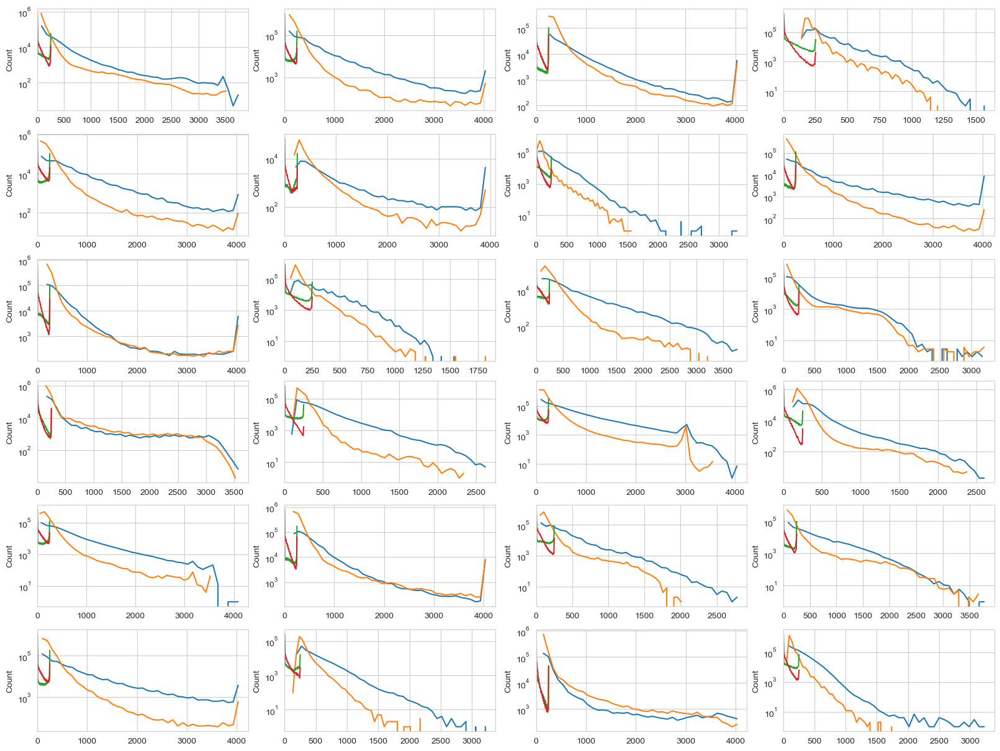

In [5]:
import pickle
from pathlib import Path
wkdir = Path(r"D:\rectify")
with open(wkdir / 'masking_final.pickle', 'rb') as f:
    masking = pickle.load(f)
nrow, ncol = 6,4
from random import sample
sample_mask = sample(masking, nrow*ncol)
import seaborn as sns

import matplotlib.pyplot as plt
fig, axs = plt.subplots(nrow, ncol, layout='constrained', figsize=(ncol*4, nrow*2))
for ax, (raw1, high1, raw2, high2) in zip(axs.flat, sample_mask):
    sns.histplot(raw1, ax=ax, bins=40, fill=False, element='poly')
    sns.histplot(raw2, ax=ax, bins=40, fill=False, element='poly')
    sns.histplot(high1, ax=ax, bins=40, fill=False, element='poly')
    sns.histplot(high2, ax=ax, bins=40, fill=False, element='poly')
    # ax.set_ylim(0, 10000)
    ax.set_xlim(0, None)
    ax.set_yscale('log')
plt.show()

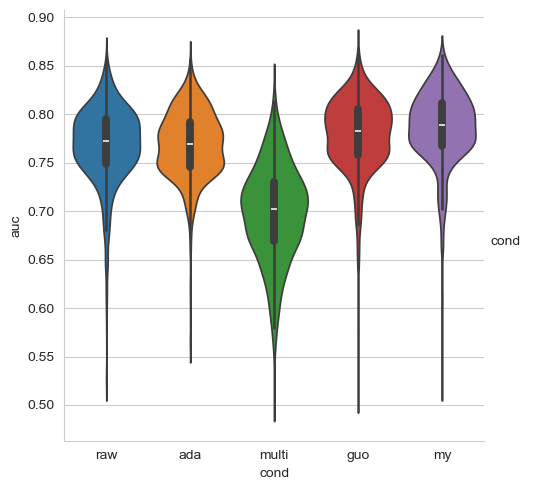

In [14]:
with open(wkdir / 'masking_auc.pickle', 'rb') as f:
    auc_raw, auc_my, auc_multi, auc_ada, auc_guo = pickle.load(f)
import pandas as pd
df = pd.concat([
    pd.DataFrame({'auc': auc_raw, 'cond': 'raw'}),
    pd.DataFrame({'auc': auc_ada, 'cond': 'ada'}),
    pd.DataFrame({'auc': auc_multi, 'cond': 'multi'}),
    pd.DataFrame({'auc': auc_guo, 'cond': 'guo'}),
    pd.DataFrame({'auc': auc_my, 'cond': 'my'}),
])
sns.catplot(df, x='cond', y='auc', kind='violin', hue='cond')


In [4]:
import pickle
with open(wkdir / 'masking_guo_metric.pickle', 'rb') as f:
    raw, my, multi, ada, guo = pickle.load(f)
sns.set(font_scale=1.2, style='ticks')
raw = np.transpose(raw)
my = np.transpose(my)
multi = np.transpose(multi)
ada = np.transpose(ada)
guo = np.transpose(guo)
import pandas as pd
import seaborn as sns
from scipy.stats import  ttest_ind
def convert_pvalue_to_asterisks(pvalue):
    if pvalue <= 0.0001:
        return "****"
    elif pvalue <= 0.001:
        return "***"
    elif pvalue <= 0.01:
        return "**"
    elif pvalue <= 0.05:
        return "*"
    return "ns"
df = pd.concat([
    pd.DataFrame({'sbc': raw[0], 'ent': raw[1], 'uni': raw[2], 'rsd': raw[3], 'cond': 'Raw' }),
    pd.DataFrame({'sbc': ada[0], 'ent': ada[1], 'uni': ada[2], 'rsd': ada[3], 'cond': 'AdaThr'}),
    pd.DataFrame({'sbc': multi[0], 'ent': multi[1], 'uni': multi[2], 'rsd': multi[3], 'cond': 'Multiscale'}),
    pd.DataFrame({'sbc': guo[0], 'ent': guo[1], 'uni': guo[2], 'rsd': guo[3], 'cond': 'Guo'}),
    pd.DataFrame({'sbc': my[0], 'ent': my[1], 'uni': my[2], 'rsd': my[3], 'cond': 'NIEND'}),
])

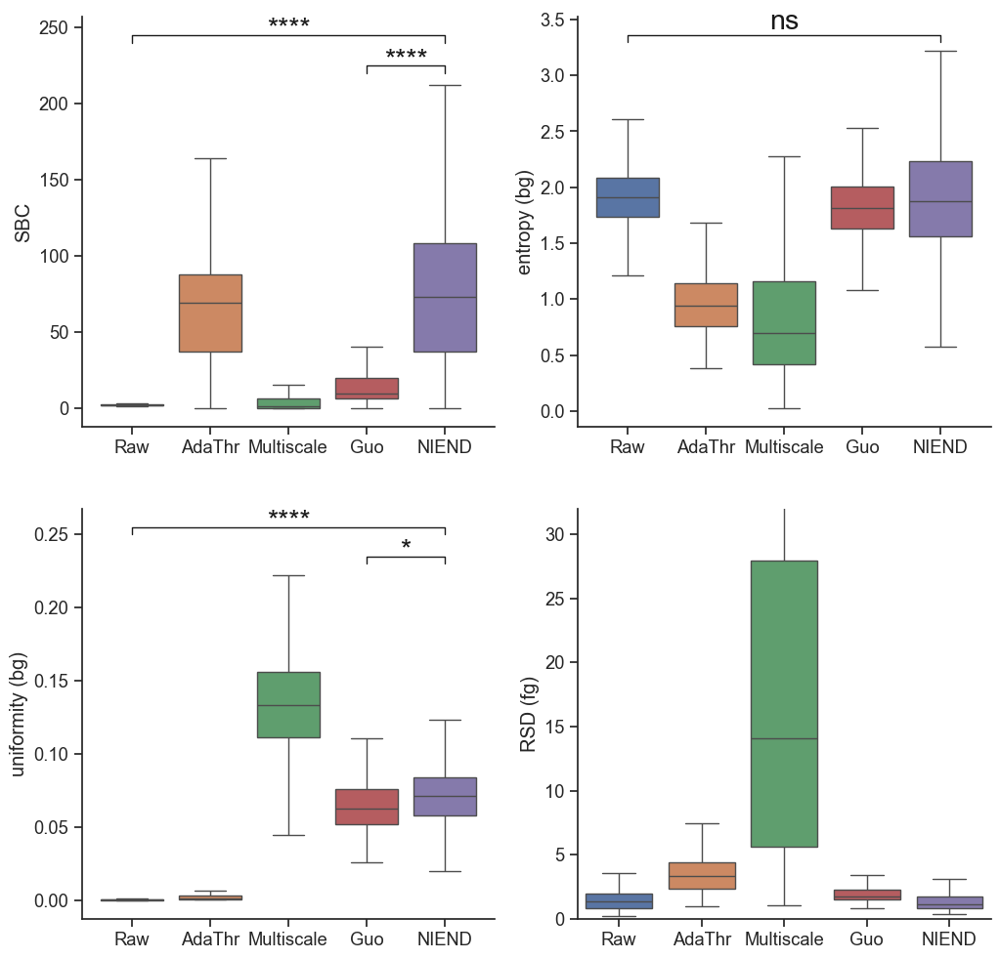

In [30]:
fig, axs = plt.subplots(2, 2, figsize=(12,12))
ax = sns.boxplot(df, x='cond', y='sbc', hue='cond', ax=axs[0, 0], showfliers=False)
ax.set_xlabel(None)
ax.set_ylabel('SBC')
x1, x2 = 0, 4
y, h = 240, 5
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(raw[0], my[0])
ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
x1, x2 = 3, 4
y, h = 220, 5
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(guo[0], my[0])
ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

ax = sns.boxplot(df, x='cond', y='ent', hue='cond', ax=axs[0, 1], showfliers=False)
ax.set_xlabel(None)
ax.set_ylabel('entropy (bg)')
x1, x2 = 0, 4
y, h = 3.3, .06
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(raw[1], my[1])
ax.text((x1+x2)*.5, y+h, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

ax = sns.boxplot(df, x='cond', y='uni', hue='cond', ax=axs[1, 0], showfliers=False)
ax.set_xlabel(None)
ax.set_ylabel('uniformity (bg)')
x1, x2 = 0, 4
y, h = .25, .005
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(raw[2], my[2])
ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')
x1, x2 = 3, 4
y, h = .23, .005
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c="k")
stat,p_value = ttest_ind(guo[2], my[2])
ax.text((x1+x2)*.5, y, convert_pvalue_to_asterisks(p_value), ha='center', va='bottom', color="k", fontsize='x-large')

ax = sns.boxplot(df, x='cond', y='rsd', hue='cond', ax=axs[1, 1], showfliers=False)
ax.set_xlabel(None)
ax.set_ylabel('RSD (fg)')
ax.set_ylim(0, 32)

sns.despine(fig)


In [92]:
(my[2].mean() - raw[2].mean()) / (guo[2].mean() - raw[2].mean())

1.0499711596105032

29.140550565719604


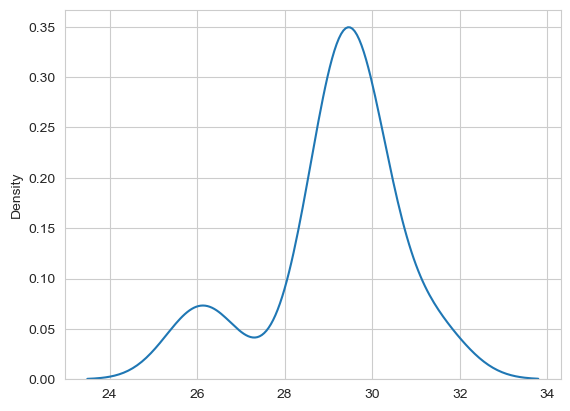

In [11]:
with open(wkdir / 'time_use.pickle', 'rb') as f:
    tt = pickle.load(f)
sns.kdeplot(tt, fill=False)
print(np.mean(tt))

1.6060503482818604


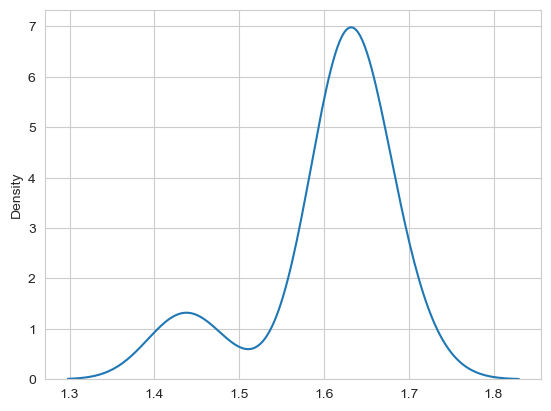

In [12]:
import pickle
from pathlib import Path
import seaborn as sns
import numpy as np
wkdir = Path(r"D:\rectify")
with open(wkdir / 'time_use_256.pickle', 'rb') as f:
    tt = pickle.load(f)
sns.kdeplot(tt, fill=False)
print(np.mean(tt))